Analysis begin

In [1]:
import os
import pandas as pd
pd.set_option('display.max_columns', None)

In [2]:
os.getcwd()

'/content'

In [3]:
PATH = '/content/drive/MyDrive/한국복지패널데이터/dataset'
!pip install pyreadstat

     |████████████████████████████████| 2.4MB 5.4MB/s 


In [4]:
!pip install shap

     |████████████████████████████████| 327kB 5.8MB/s 
  Created wheel for shap: filename=shap-0.37.0-cp36-cp36m-linux_x86_64.whl size=463909 sha256=900e576887da7279aa71f2781e41388f28752d26fead7c1763d9e846f65205ba
  Stored in directory: /root/.cache/pip/wheels/df/ad/b0/aa7815ec68850d66551ef618095eccb962c8f6022f1d3dd989
Successfully built shap


In [5]:
!pip install featuretools

     |████████████████████████████████| 296kB 5.8MB/s 
     |████████████████████████████████| 675kB 28.3MB/s 
     |████████████████████████████████| 102kB 9.2MB/s 
     |████████████████████████████████| 102kB 7.8MB/s 
  Created wheel for contextvars: filename=contextvars-2.4-cp36-none-any.whl size=7667 sha256=0c67710abec60831a263c1721f839410aad1ffce38d46f6fee2535b09ae0fe6b
  Stored in directory: /root/.cache/pip/wheels/a5/7d/68/1ebae2668bda2228686e3c1cf16f2c2384cea6e9334ad5f6de
  Created wheel for locket: filename=locket-0.2.0-cp36-none-any.whl size=4042 sha256=6292ae79b633de811bda0629add9bef38fe8fba01773fe42bdf34241fac35823
  Stored in directory: /root/.cache/pip/wheels/26/1e/e8/4fa236ec931b1a0cdd61578e20d4934d7bf188858723b84698
Successfully built contextvars locket
ERROR: distributed 2020.12.0 has requirement cloudpickle>=1.5.0, but you'll have cloudpickle 1.3.0 which is incompatible.
ERROR: distributed 2020.12.0 has requirement dask>=2020.12.0, but you'll have dask 2.12.0 which i

In [6]:
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.model_selection import StratifiedKFold, train_test_split, ShuffleSplit
from sklearn.metrics import f1_score
import itertools
import lightgbm as lgb
import xgboost as xgb
from xgboost import XGBClassifier
import shap
from tqdm import tqdm
import featuretools as ft
import warnings 
warnings.filterwarnings('ignore')
import time

In [7]:
data_long = pd.read_spss(os.path.join(PATH, 'koweps_h01_14_long_beta1.sav'))

In [8]:
data_wide = pd.read_spss(os.path.join(PATH, 'koweps_h01_14_wide_beta1.sav'))

In [9]:
data2018 = data_long[data_long.year == 2018.0]
data2018.head()

h_merkey    year    wv  wv_num  first_wv  last_wv      h_ws         h_wg  \
21   20101.0  2018.0  14.0    14.0       1.0     14.0  0.510583  2061.516178   
35   30101.0  2018.0  14.0    14.0       1.0     14.0  0.708158  2859.240531   
49   40101.0  2018.0  14.0    14.0       1.0     14.0  0.469998  1897.652598   
64   60101.0  2018.0  14.0    14.0       1.0     14.0  0.546769  2207.618261   
88   80101.0  2018.0  14.0    14.0       1.0     14.0  0.281215  1135.424694   

    h_id  h_ind  h_sn  h_new  h_cobf  h_ws_all     h_wg_all  h_reg5  h_reg7  \
21   2.0    1.0   1.0    0.0     NaN  0.571621  1783.373525     1.0     1.0   
35   3.0    1.0   1.0    0.0     NaN  0.749466  2338.224212     1.0     1.0   
49   4.0    1.0   1.0    0.0     NaN  0.525509  1639.512033     1.0     1.0   
64   6.0    1.0   1.0    0.0     NaN  0.618136  1928.494587     1.0     1.0   
88   8.0    1.0   1.0    0.0     NaN  0.304325   949.451412     3.0     2.0   

     h_din   h_cin  h_flag  h_hc  h_hc_all  nh01_1  nh01_2  h01_1  h_pind1  \
21  2234.0  2330.0     0.0   1.0       1.0     NaN     NaN    1.0      1.0   
35   801.8   815.0     0.0   2.0       2.0     NaN     NaN    1.0      1.0   
49  2044.0  2116.0     0.0   1.0       1.0     NaN     NaN    1.0      1.0   
64  4696.0  5008.0     0.0   1.0       1.0     NaN     NaN    5.0      1.0   
88  1330.8  1332.0     0.0   2.0       2.0     NaN     NaN    1.0      1.0   

    h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  h01_7  h01_8  h01_9  h01_11  \
21   201.0    1.0   10.0    2.0  1945.0    4.0    5.0    0.0    0.0     2.0   
35   301.0    1.0   10.0    1.0  1948.0    3.0    5.0    0.0    0.0     2.0   
49   401.0    1.0   10.0    1.0  1942.0    7.0    3.0    0.0    0.0     3.0   
64   601.0    1.0   10.0    1.0  1962.0    6.0    5.0    0.0    0.0     1.0   
88   801.0    1.0   10.0    2.0  1940.0    3.0    3.0    1.0    6.0     2.0   

    h01_12  h01_13  h_pind2  h_pid2  h01_14  h01_15  h01_16  h01_17  h01_18  \
21     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64     1.0     1.0      1.0   602.0     2.0    20.0     2.0  1963.0     5.0   
88     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_19  h01_20  h01_21  h01_23  h01_24  h01_25  h_pind3  h_pid3  h01_26  \
21     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
64     5.0     0.0     0.0     1.0     1.0     1.0      1.0   603.0     3.0   
88     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   

    h01_27  h01_28  h01_29  h01_30  h01_31  h01_32  h01_33  h01_35  h01_36  \
21     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64    11.0     2.0  2003.0     4.0     1.0     0.0     0.0     0.0     1.0   
88     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_37  h_pind4  h_pid4  h01_38  h01_39  h01_40  h01_41  h01_42  h01_43  \
21     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64     1.0      1.0   604.0     4.0     1.0     1.0  1927.0     4.0     5.0   
88     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_44  h01_45  h01_47  h01_48  h01_49  h_pind5  h_pid5  h01_50  h01_51  \
21     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN      NaN 

In [10]:
print(data_long.columns)

Index(['h_merkey', 'year', 'wv', 'wv_num', 'first_wv', 'last_wv', 'h_ws',
       'h_wg', 'h_id', 'h_ind',
       ...
       'h13_9', 'h13_13', 'h13_17', 'h13_21', 'h13_25', 'h13_29', 'h13_33',
       'h13_37', 'h13_41', 'release_date'],
      dtype='object', length=1805)


Brief intro to some of the important features: 
h01_111 : 기초 보장 수급 형태
h01_5aq1, 5aq2



h_hc : 일반가구 or 저소득층 가구 (1 or 2)
h12_13 : 수급자 선정 여부 - Wheter selected as a subsidized or not  
h12_16 : 수급대상 가구 탈피 예상 기간 - When is expected to get out of the subsidized household
h12_18 : 수급자 탈피 이유 - The reason for getting out of the poverty subsidized target household

In [12]:
data_long.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92857 entries, 0 to 92856
Columns: 1805 entries, h_merkey to release_date
dtypes: float64(1804), object(1)
memory usage: 1.2+ GB


In [13]:
data2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6331 entries, 21 to 92856
Columns: 1805 entries, h_merkey to release_date
dtypes: float64(1804), object(1)
memory usage: 87.2+ MB


In [14]:
data2018.h_hc.value_counts()

1.0    2995
2.0    1897
Name: h_hc, dtype: int64

In [15]:
import matplotlib as mpl
import matplotlib.pyplot as plt

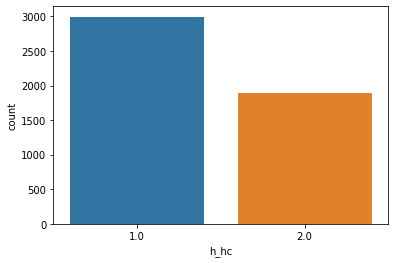

In [16]:
import seaborn as sns
sns.countplot(data2018.h_hc)
#1 - Ordinary, 2: Poor household (60% of Median of the household income)

In [17]:
data2018.h_merkey.describe()

count    6.331000e+03
mean     4.877202e+07
std      2.828512e+07
min      2.010100e+04
25%      2.487010e+07
50%      4.812010e+07
75%      6.876080e+07
max      9.800070e+07
Name: h_merkey, dtype: float64

In [18]:
data2018.h_merkey.value_counts()

29360101.0    1
84610701.0    1
27430101.0    1
39160101.0    1
50280101.0    1
             ..
10140101.0    1
5070101.0     1
89510701.0    1
56290101.0    1
22020101.0    1
Name: h_merkey, Length: 6331, dtype: int64

In [19]:
data_long_household = data_long.groupby('h_merkey')

In [20]:
data_long_household.head()

h_merkey    year    wv  wv_num  first_wv  last_wv      h_ws  \
0         10101.0  2005.0   1.0     8.0       1.0     13.0  0.362887   
1         10101.0  2011.0   7.0     8.0       1.0     13.0  0.253686   
2         10101.0  2012.0   8.0     8.0       1.0     13.0  0.485991   
3         10101.0  2013.0   9.0     8.0       1.0     13.0  0.487753   
4         10101.0  2014.0  10.0     8.0       1.0     13.0  0.487315   
...           ...     ...   ...     ...       ...      ...       ...   
92849  98000701.0  2011.0   7.0     8.0       7.0     14.0       NaN   
92850  98000701.0  2012.0   8.0     8.0       7.0     14.0       NaN   
92851  98000701.0  2013.0   9.0     8.0       7.0     14.0       NaN   
92852  98000701.0  2014.0  10.0     8.0       7.0     14.0       NaN   
92853  98000701.0  2015.0  11.0     8.0       7.0     14.0       NaN   

              h_wg    h_id  h_ind  h_sn  h_new  h_cobf  h_ws_all     h_wg_all  \
0       815.219792     1.0    1.0   1.0    NaN     NaN       NaN          NaN   
1       769.749989     1.0    1.0   1.0    0.0     0.0  0.340156   810.678070   
2      1567.080473     1.0    1.0   1.0    0.0     0.0  0.488716  1210.996500   
3      1649.326629     1.0    1.0   1.0    0.0     0.0  0.474889  1239.002359   
4      1706.010843     1.0    1.0   1.0    0.0     0.0  0.467776  1265.510373   
...            ...     ...    ...   ...    ...     ...       ...          ...   
92849          NaN  9800.0    7.0   1.0    1.0     0.0  0.241085   574.568088   
92850          NaN  9800.0    7.0   1.0    1.0     0.0  0.287931   713.467454   
92851          NaN  9800.0    7.0   1.0    1.0     0.0  0.239065   623.728947   
92852          NaN  9800.0    7.0   1.0    1.0     0.0  0.378497  1023.977123   
92853          NaN  9800.0    7.0   1.0    1.0     0.0  0.566101  1600.954885   

       h_reg5  h_reg7   h_din    h_cin  h_flag  h_hc  h_hc_all  nh01_1  \
0         1.0     1.0   608.0    614.0     NaN   2.0       NaN     NaN   
1         1.0     1.0   858.8    896.0     NaN   2.0       2.0     NaN   
2         1.0     1.0  1260.8   1310.0     0.0   2.0       2.0     NaN   
3         1.0     1.0  2172.0   2208.0     0.0   1.0       1.0     NaN   
4         1.0     1.0   864.0    864.0     0.0   2.0       2.0     NaN   
...       ...     ...     ...      ...     ...   ...       ...     ...   
92849     4.0     6.0  6287.0   6995.0     NaN   NaN       1.0     NaN   
92850     3.0     7.0  4953.0   5613.0     0.0   NaN       1.0     NaN   
92851     3.0     7.0  5162.0   6194.0     0.0   NaN       1.0     NaN   
92852     4.0     5.0  9764.0  11600.0     0.0   NaN       1.0     NaN   
92853     4.0     5.0  7811.0   8327.0     0.0   NaN       1.0     NaN   

       nh01_2  h01_1  h_pind1    h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  \
0         NaN    1.0      1.0     101.0    1.0   10.0    2.0  1936.0    2.0   
1         NaN    1.0      1.0     101.0    1.0   10.0    2.0  1936.0    2.0   
2         NaN    1.0      1.0     101.0    1.0   10.0    2.0  1936.0    2.0   
3         NaN    1.0      1.0     101.0    1.0   10.0    2.0  1936.0    2.0   
4         NaN    1.0      1.0     101.0    1.0   10.0    2.0  1936.0    2.0   
...       ...    ...      ...       ...    ...    ...    ...     ...    ...   
92849     NaN    6.0      7.0  980001.0    1.0   10.0    1.0  1967.0    5.0   
92850     NaN    6.0      7.0  980001.0    1.0   10.0    1.0  1967.0    5.0   
92851     NaN    6.0      7.0  980001.0    1.0   10.0    1.0  1967.0    5.0   
92852     NaN    6.0      7.0  980001.0    1.0   10.0    1.0  1967.0    5.0   
92853     NaN    6.0      7.0  980001.0    1.0   10.0    1.0  1967.0    5.0   

       h01_7  h01_8  h01_9  h01_11  h01_12  h01_13  h_pind2    h_pid2  h01_14  \
0        0.0    0.0    0.0     2.0     2.0     1.0      NaN       NaN     NaN   
1        0.0    0.0    0.0     2.0     2.0     1.0      NaN       NaN     NaN   
2        0.0    0.0    0.0     2.0     2.0     1.0      NaN       NaN     NaN   
3        

In [21]:
data_long_pivot = data_long.pivot_table(values = "h_merkey", index = 'year', columns = 'h_hc', aggfunc="count")

In [22]:
total = data2018.isnull().sum().sort_values(ascending=False)
percent = 100 * (data2018.isnull().sum() / data2018.isnull().count()).sort_values(ascending=False)
missing_df = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

missing_df

,Total,Percent
h08_7aq7,6331,100.0
h12_2_7aq76,6331,100.0
h12_2_7aq74,6331,100.0
h12_2_7aq73,6331,100.0
h12_2_7aq72,6331,100.0
...,...,...
h08_4,0,0.0
h08_6,0,0.0
h08_8,0,0.0
h08_10,0,0.0


In [23]:
import numpy as np
train_labels_2018 = np.array(data2018['h_hc_all'])
train_labels_2018

array([1., 2., 1., ..., 2., 1., 1.])

In [24]:
data2018.h_hc_all.value_counts()

1.0    3692
2.0    2639
Name: h_hc_all, dtype: int64

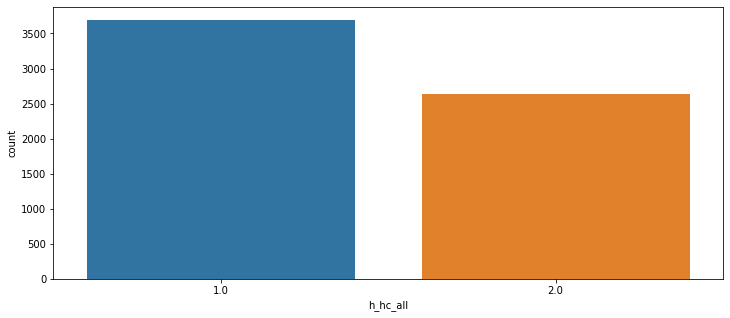

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(12,5))
sns.countplot(data=data2018, x="h_hc_all")
plt.show()

In [26]:
data2018.h_hc.isnull().sum()

1439

In [27]:
data2018.h_hc_all.isnull().sum()

0

In [28]:
train_set_2018 = data2018.drop(columns = ["h_hc", "h_hc_all", "h_merkey", "year", "wv", "wv_num", "first_wv", "last_wv", "h13_4aq15", "h_cin", "h_din", "h08_148", "h08_aq12", "h08_14aq2", "h08_aq2", "h08_124", "h08_122"])
train_set_2018.head()

h_ws         h_wg  h_id  h_ind  h_sn  h_new  h_cobf  h_ws_all  \
21  0.510583  2061.516178   2.0    1.0   1.0    0.0     NaN  0.571621   
35  0.708158  2859.240531   3.0    1.0   1.0    0.0     NaN  0.749466   
49  0.469998  1897.652598   4.0    1.0   1.0    0.0     NaN  0.525509   
64  0.546769  2207.618261   6.0    1.0   1.0    0.0     NaN  0.618136   
88  0.281215  1135.424694   8.0    1.0   1.0    0.0     NaN  0.304325   

       h_wg_all  h_reg5  h_reg7  h_flag  nh01_1  nh01_2  h01_1  h_pind1  \
21  1783.373525     1.0     1.0     0.0     NaN     NaN    1.0      1.0   
35  2338.224212     1.0     1.0     0.0     NaN     NaN    1.0      1.0   
49  1639.512033     1.0     1.0     0.0     NaN     NaN    1.0      1.0   
64  1928.494587     1.0     1.0     0.0     NaN     NaN    5.0      1.0   
88   949.451412     3.0     2.0     0.0     NaN     NaN    1.0      1.0   

    h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  h01_7  h01_8  h01_9  h01_11  \
21   201.0    1.0   10.0    2.0  1945.0    4.0    5.0    0.0    0.0     2.0   
35   301.0    1.0   10.0    1.0  1948.0    3.0    5.0    0.0    0.0     2.0   
49   401.0    1.0   10.0    1.0  1942.0    7.0    3.0    0.0    0.0     3.0   
64   601.0    1.0   10.0    1.0  1962.0    6.0    5.0    0.0    0.0     1.0   
88   801.0    1.0   10.0    2.0  1940.0    3.0    3.0    1.0    6.0     2.0   

    h01_12  h01_13  h_pind2  h_pid2  h01_14  h01_15  h01_16  h01_17  h01_18  \
21     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64     1.0     1.0      1.0   602.0     2.0    20.0     2.0  1963.0     5.0   
88     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_19  h01_20  h01_21  h01_23  h01_24  h01_25  h_pind3  h_pid3  h01_26  \
21     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
64     5.0     0.0     0.0     1.0     1.0     1.0      1.0   603.0     3.0   
88     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   

    h01_27  h01_28  h01_29  h01_30  h01_31  h01_32  h01_33  h01_35  h01_36  \
21     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64    11.0     2.0  2003.0     4.0     1.0     0.0     0.0     0.0     1.0   
88     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_37  h_pind4  h_pid4  h01_38  h01_39  h01_40  h01_41  h01_42  h01_43  \
21     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64     1.0      1.0   604.0     4.0     1.0     1.0  1927.0     4.0     5.0   
88     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_44  h01_45  h01_47  h01_48  h01_49  h_pind5  h_pid5  h01_50  h01_51  \
21     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN     NaN   
64     0.0     0.0     1.0     1.0     1.0      1.0   605.0     5.0     2.0   
88     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN     NaN   

    h01_52  h01_53  h01_54  h01_55  h01_56  h01_57  h01_59  h01_60  h01_61  \
21     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     N

In [29]:
merkey2018 = data2018.drop(columns = ["h_hc", "h_hc_all", "year", "wv", "wv_num", "first_wv", "last_wv", "h13_4aq15", "h_cin", "h_din", "h08_148", "h08_aq12", "h08_14aq2", "h08_aq2", "h08_124", "h08_122"])
merkey2018.head()

h_merkey      h_ws         h_wg  h_id  h_ind  h_sn  h_new  h_cobf  \
21   20101.0  0.510583  2061.516178   2.0    1.0   1.0    0.0     NaN   
35   30101.0  0.708158  2859.240531   3.0    1.0   1.0    0.0     NaN   
49   40101.0  0.469998  1897.652598   4.0    1.0   1.0    0.0     NaN   
64   60101.0  0.546769  2207.618261   6.0    1.0   1.0    0.0     NaN   
88   80101.0  0.281215  1135.424694   8.0    1.0   1.0    0.0     NaN   

    h_ws_all     h_wg_all  h_reg5  h_reg7  h_flag  nh01_1  nh01_2  h01_1  \
21  0.571621  1783.373525     1.0     1.0     0.0     NaN     NaN    1.0   
35  0.749466  2338.224212     1.0     1.0     0.0     NaN     NaN    1.0   
49  0.525509  1639.512033     1.0     1.0     0.0     NaN     NaN    1.0   
64  0.618136  1928.494587     1.0     1.0     0.0     NaN     NaN    5.0   
88  0.304325   949.451412     3.0     2.0     0.0     NaN     NaN    1.0   

    h_pind1  h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  h01_7  h01_8  h01_9  \
21      1.0   201.0    1.0   10.0    2.0  1945.0    4.0    5.0    0.0    0.0   
35      1.0   301.0    1.0   10.0    1.0  1948.0    3.0    5.0    0.0    0.0   
49      1.0   401.0    1.0   10.0    1.0  1942.0    7.0    3.0    0.0    0.0   
64      1.0   601.0    1.0   10.0    1.0  1962.0    6.0    5.0    0.0    0.0   
88      1.0   801.0    1.0   10.0    2.0  1940.0    3.0    3.0    1.0    6.0   

    h01_11  h01_12  h01_13  h_pind2  h_pid2  h01_14  h01_15  h01_16  h01_17  \
21     2.0     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN   
35     2.0     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN   
49     3.0     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN   
64     1.0     1.0     1.0      1.0   602.0     2.0    20.0     2.0  1963.0   
88     2.0     1.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN   

    h01_18  h01_19  h01_20  h01_21  h01_23  h01_24  h01_25  h_pind3  h_pid3  \
21     NaN     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN   
64     5.0     5.0     0.0     0.0     1.0     1.0     1.0      1.0   603.0   
88     NaN     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN   

    h01_26  h01_27  h01_28  h01_29  h01_30  h01_31  h01_32  h01_33  h01_35  \
21     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64     3.0    11.0     2.0  2003.0     4.0     1.0     0.0     0.0     0.0   
88     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_36  h01_37  h_pind4  h_pid4  h01_38  h01_39  h01_40  h01_41  h01_42  \
21     NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
64     1.0     1.0      1.0   604.0     4.0     1.0     1.0  1927.0     4.0   
88     NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   

    h01_43  h01_44  h01_45  h01_47  h01_48  h01_49  h_pind5  h_pid5  h01_50  \
21     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
49     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
64     5.0     0.0     0.0     1.0     1.0     1.0      1.0   605.0     5.0   
88     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   

    h01_51  h01_52  h01_53  h01_54  h01_55  h01_56  h01_57  h01_59  h01_60  \
21     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
35     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
49     NaN     NaN     N

In [30]:
data2014 = data_long[data_long.year == 2014.0]
data2014.head()

h_merkey    year    wv  wv_num  first_wv  last_wv      h_ws         h_wg  \
4    10101.0  2014.0  10.0     8.0       1.0     13.0  0.487315  1706.010843   
17   20101.0  2014.0  10.0    14.0       1.0     14.0  0.459949  1610.207141   
31   30101.0  2014.0  10.0    14.0       1.0     14.0  0.590172  2066.096809   
45   40101.0  2014.0  10.0    14.0       1.0     14.0  0.429129  1502.310688   
60   60101.0  2014.0  10.0    14.0       1.0     14.0  0.375207  1313.539344   

    h_id  h_ind  h_sn  h_new  h_cobf  h_ws_all     h_wg_all  h_reg5  h_reg7  \
4    1.0    1.0   1.0    0.0     0.0  0.467776  1265.510373     1.0     1.0   
17   2.0    1.0   1.0    0.0     0.0  0.527389  1426.785752     1.0     1.0   
31   3.0    1.0   1.0    0.0     0.0  0.652258  1764.603124     1.0     1.0   
45   4.0    1.0   1.0    0.0     0.0  0.417713  1130.070984     1.0     1.0   
60   6.0    1.0   1.0    0.0     0.0  0.450046  1217.544875     1.0     1.0   

     h_din   h_cin  h_flag  h_hc  h_hc_all  nh01_1  nh01_2  h01_1  h_pind1  \
4    864.0   864.0     0.0   2.0       2.0     NaN     NaN    1.0      1.0   
17   600.0   600.0     0.0   2.0       2.0     NaN     NaN    1.0      1.0   
31  1571.0  1619.0     0.0   1.0       1.0     NaN     NaN    1.0      1.0   
45  3579.0  3687.0     0.0   1.0       1.0     NaN     NaN    2.0      1.0   
60  3030.0  3486.0     0.0   1.0       1.0     NaN     NaN    5.0      1.0   

    h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  h01_7  h01_8  h01_9  h01_11  \
4    101.0    1.0   10.0    2.0  1936.0    2.0    0.0    0.0    0.0     2.0   
17   201.0    1.0   10.0    2.0  1945.0    4.0    5.0    0.0    0.0     2.0   
31   301.0    1.0   10.0    1.0  1948.0    3.0    5.0    0.0    0.0     2.0   
45   401.0    1.0   10.0    1.0  1942.0    7.0    3.0    0.0    0.0     3.0   
60   601.0    1.0   10.0    1.0  1962.0    6.0    5.0    0.0    0.0     1.0   

    h01_12  h01_13  h_pind2  h_pid2  h01_14  h01_15  h01_16  h01_17  h01_18  \
4      2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     1.0     1.0      4.0   402.0     2.0     2.0     2.0  1923.0     2.0   
60     1.0     1.0      1.0   602.0     2.0    20.0     2.0  1963.0     5.0   

    h01_19  h01_20  h01_21  h01_23  h01_24  h01_25  h_pind3  h_pid3  h01_26  \
4      NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
31     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
45     0.0     0.0     0.0     2.0     1.0     1.0      NaN     NaN     NaN   
60     5.0     0.0     0.0     1.0     1.0     1.0      1.0   603.0     3.0   

    h01_27  h01_28  h01_29  h01_30  h01_31  h01_32  h01_33  h01_35  h01_36  \
4      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
60    11.0     2.0  2003.0     3.0     1.0     0.0     0.0     0.0     1.0   

    h01_37  h_pind4  h_pid4  h01_38  h01_39  h01_40  h01_41  h01_42  h01_43  \
4      NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
60     1.0      1.0   604.0     4.0     1.0     1.0  1927.0     4.0     5.0   

    h01_44  h01_45  h01_47  h01_48  h01_49  h_pind5  h_pid5  h01_50  h01_51  \
4      NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN      NaN 

In [31]:
merkey2014 = data2014.drop(columns = ["h_hc", "h_hc_all", "year", "wv", "wv_num", "first_wv", "last_wv", "h13_4aq15", "h_cin", "h_din", "h08_148", "h08_aq12", "h08_14aq2", "h08_aq2", "h08_124", "h08_122"])
merkey2014.head()

h_merkey      h_ws         h_wg  h_id  h_ind  h_sn  h_new  h_cobf  \
4    10101.0  0.487315  1706.010843   1.0    1.0   1.0    0.0     0.0   
17   20101.0  0.459949  1610.207141   2.0    1.0   1.0    0.0     0.0   
31   30101.0  0.590172  2066.096809   3.0    1.0   1.0    0.0     0.0   
45   40101.0  0.429129  1502.310688   4.0    1.0   1.0    0.0     0.0   
60   60101.0  0.375207  1313.539344   6.0    1.0   1.0    0.0     0.0   

    h_ws_all     h_wg_all  h_reg5  h_reg7  h_flag  nh01_1  nh01_2  h01_1  \
4   0.467776  1265.510373     1.0     1.0     0.0     NaN     NaN    1.0   
17  0.527389  1426.785752     1.0     1.0     0.0     NaN     NaN    1.0   
31  0.652258  1764.603124     1.0     1.0     0.0     NaN     NaN    1.0   
45  0.417713  1130.070984     1.0     1.0     0.0     NaN     NaN    2.0   
60  0.450046  1217.544875     1.0     1.0     0.0     NaN     NaN    5.0   

    h_pind1  h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  h01_7  h01_8  h01_9  \
4       1.0   101.0    1.0   10.0    2.0  1936.0    2.0    0.0    0.0    0.0   
17      1.0   201.0    1.0   10.0    2.0  1945.0    4.0    5.0    0.0    0.0   
31      1.0   301.0    1.0   10.0    1.0  1948.0    3.0    5.0    0.0    0.0   
45      1.0   401.0    1.0   10.0    1.0  1942.0    7.0    3.0    0.0    0.0   
60      1.0   601.0    1.0   10.0    1.0  1962.0    6.0    5.0    0.0    0.0   

    h01_11  h01_12  h01_13  h_pind2  h_pid2  h01_14  h01_15  h01_16  h01_17  \
4      2.0     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN   
17     2.0     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN   
31     2.0     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN   
45     3.0     1.0     1.0      4.0   402.0     2.0     2.0     2.0  1923.0   
60     1.0     1.0     1.0      1.0   602.0     2.0    20.0     2.0  1963.0   

    h01_18  h01_19  h01_20  h01_21  h01_23  h01_24  h01_25  h_pind3  h_pid3  \
4      NaN     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN   
31     NaN     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN   
45     2.0     0.0     0.0     0.0     2.0     1.0     1.0      NaN     NaN   
60     5.0     5.0     0.0     0.0     1.0     1.0     1.0      1.0   603.0   

    h01_26  h01_27  h01_28  h01_29  h01_30  h01_31  h01_32  h01_33  h01_35  \
4      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
60     3.0    11.0     2.0  2003.0     3.0     1.0     0.0     0.0     0.0   

    h01_36  h01_37  h_pind4  h_pid4  h01_38  h01_39  h01_40  h01_41  h01_42  \
4      NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     NaN     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
60     1.0     1.0      1.0   604.0     4.0     1.0     1.0  1927.0     4.0   

    h01_43  h01_44  h01_45  h01_47  h01_48  h01_49  h_pind5  h_pid5  h01_50  \
4      NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
31     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
45     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
60     5.0     0.0     0.0     1.0     1.0     1.0      1.0   605.0     5.0   

    h01_51  h01_52  h01_53  h01_54  h01_55  h01_56  h01_57  h01_59  h01_60  \
4      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     NaN     NaN     N

In [32]:
from sklearn.model_selection import train_test_split

In [33]:
from sklearn.metrics import accuracy_score

def calculate_accuracy(model, x_test, y_test):
    y_pred = model.predict(x_test)
    predictions = [round(value) for value in y_pred]
    
    accuracy = accuracy_score(y_test, predictions)
    print('Accuracy: %.2f%%' % (accuracy * 100.0))
    return accuracy

In [34]:
import xgboost
from matplotlib.pylab import rcParams

In [35]:
data1418 = pd.concat([data2014, data2018])

In [36]:
data1418.head()

h_merkey    year    wv  wv_num  first_wv  last_wv      h_ws         h_wg  \
4    10101.0  2014.0  10.0     8.0       1.0     13.0  0.487315  1706.010843   
17   20101.0  2014.0  10.0    14.0       1.0     14.0  0.459949  1610.207141   
31   30101.0  2014.0  10.0    14.0       1.0     14.0  0.590172  2066.096809   
45   40101.0  2014.0  10.0    14.0       1.0     14.0  0.429129  1502.310688   
60   60101.0  2014.0  10.0    14.0       1.0     14.0  0.375207  1313.539344   

    h_id  h_ind  h_sn  h_new  h_cobf  h_ws_all     h_wg_all  h_reg5  h_reg7  \
4    1.0    1.0   1.0    0.0     0.0  0.467776  1265.510373     1.0     1.0   
17   2.0    1.0   1.0    0.0     0.0  0.527389  1426.785752     1.0     1.0   
31   3.0    1.0   1.0    0.0     0.0  0.652258  1764.603124     1.0     1.0   
45   4.0    1.0   1.0    0.0     0.0  0.417713  1130.070984     1.0     1.0   
60   6.0    1.0   1.0    0.0     0.0  0.450046  1217.544875     1.0     1.0   

     h_din   h_cin  h_flag  h_hc  h_hc_all  nh01_1  nh01_2  h01_1  h_pind1  \
4    864.0   864.0     0.0   2.0       2.0     NaN     NaN    1.0      1.0   
17   600.0   600.0     0.0   2.0       2.0     NaN     NaN    1.0      1.0   
31  1571.0  1619.0     0.0   1.0       1.0     NaN     NaN    1.0      1.0   
45  3579.0  3687.0     0.0   1.0       1.0     NaN     NaN    2.0      1.0   
60  3030.0  3486.0     0.0   1.0       1.0     NaN     NaN    5.0      1.0   

    h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  h01_7  h01_8  h01_9  h01_11  \
4    101.0    1.0   10.0    2.0  1936.0    2.0    0.0    0.0    0.0     2.0   
17   201.0    1.0   10.0    2.0  1945.0    4.0    5.0    0.0    0.0     2.0   
31   301.0    1.0   10.0    1.0  1948.0    3.0    5.0    0.0    0.0     2.0   
45   401.0    1.0   10.0    1.0  1942.0    7.0    3.0    0.0    0.0     3.0   
60   601.0    1.0   10.0    1.0  1962.0    6.0    5.0    0.0    0.0     1.0   

    h01_12  h01_13  h_pind2  h_pid2  h01_14  h01_15  h01_16  h01_17  h01_18  \
4      2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     2.0     1.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     1.0     1.0      4.0   402.0     2.0     2.0     2.0  1923.0     2.0   
60     1.0     1.0      1.0   602.0     2.0    20.0     2.0  1963.0     5.0   

    h01_19  h01_20  h01_21  h01_23  h01_24  h01_25  h_pind3  h_pid3  h01_26  \
4      NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
31     NaN     NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
45     0.0     0.0     0.0     2.0     1.0     1.0      NaN     NaN     NaN   
60     5.0     0.0     0.0     1.0     1.0     1.0      1.0   603.0     3.0   

    h01_27  h01_28  h01_29  h01_30  h01_31  h01_32  h01_33  h01_35  h01_36  \
4      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
60    11.0     2.0  2003.0     3.0     1.0     0.0     0.0     0.0     1.0   

    h01_37  h_pind4  h_pid4  h01_38  h01_39  h01_40  h01_41  h01_42  h01_43  \
4      NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
17     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
31     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
45     NaN      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
60     1.0      1.0   604.0     4.0     1.0     1.0  1927.0     4.0     5.0   

    h01_44  h01_45  h01_47  h01_48  h01_49  h_pind5  h_pid5  h01_50  h01_51  \
4      NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN     NaN   
17     NaN     NaN     NaN     NaN     NaN      NaN 

In [37]:
data1418_ess = data1418[['h_merkey','year', 'h_hc_all']]
data1418_ess.tail()

,h_merkey,year,h_hc_all
92817,97950701.0,2018.0,2.0
92825,97960701.0,2018.0,2.0
92833,97970701.0,2018.0,2.0
92841,97980701.0,2018.0,1.0
92856,98000701.0,2018.0,1.0


In [38]:
data_wide.head()

,h_merkey,first_wv,last_wv,wv_num,wv01,wv02,wv03,wv04,wv05,wv06,wv07,wv08,wv09,wv10,wv11,wv12,wv13,wv14,year01,h01_id,h01_ind,h01_sn,h01_merkey,h01_ws,h01_wg,h01_reg5,h01_reg7,h01_din,h01_cin,h01_hc,h0101_1,h01_pind1,h01_pid1,h0101_2,h0101_3,h0101_4,h0101_5,h0101_6,h0101_7,h0101_8,h0101_9,h0101_10,h0101_11,h0101_12,h0101_13,h01_pind2,h01_pid2,h0101_14,h0101_15,h0101_16,h0101_17,h0101_18,h0101_19,h0101_20,h0101_21,h0101_22,h0101_23,h0101_24,h0101_25,h01_pind3,h01_pid3,h0101_26,h0101_27,h0101_28,h0101_29,h0101_30,h0101_31,h0101_32,h0101_33,h0101_34,h0101_35,h0101_36,h0101_37,h01_pind4,h01_pid4,h0101_38,h0101_39,h0101_40,h0101_41,h0101_42,h0101_43,h0101_44,h0101_45,h0101_46,h0101_47,h0101_48,h0101_49,h01_pind5,h01_pid5,h0101_50,h0101_51,h0101_52,h0101_53,h0101_54,h0101_55,h0101_56,h0101_57,h0101_58,h0101_59,h0101_60,h0101_61,h01_pind6,h01_pid6,h0101_62,h0101_63,h0101_64,h0101_65,h0101_66,h0101_67,h0101_68,h0101_69,h0101_70,h0101_71,h0101_72,h0101_73,h01_pind7,h01_pid7,h0101_74,h0101_75,h0101_76,h0101_77,h0101_78,h0101_79,h0101_80,h0101_81,h0101_82,h0101_83,h0101_84,h0101_85,h01_pind8,h01_pid8,h0101_86,h0101_87,h0101_88,h0101_89,h0101_90,h0101_91,h0101_92,h0101_93,h0101_94,h0101_95,h0101_96,h0101_97,h01_pind9,h01_pid9,h0101_98,h0101_99,h0101_100,h0101_101,h0101_102,h0101_103,h0101_104,h0101_105,h0101_106,h0101_107,h0101_108,h0101_109,h0101_110,h0101_111,h0102_1,h0102_2,h0102_3,h0102_4,h0102_5,h0102_6,h0102_7,h0102_8,h0102_9,h0102_10,h0102_11,h0102_12,h0102_13,h0102_14,h0102_15,h0102_16,h0102_17,h0102_18,h0102_19,h0102_20,h0102_21,h0102_22,h0102_23,h0102_24,h0102_25,h0102_26,h0102_27,h0102_28,h0102_29,h0102_30,h0102_31,h0102_32,h0102_33,h0102_34,h0102_35,h0102_36,h0102_37,h0102_38,h0102_39,h0102_40,h0102_41,h0102_42,h0102_43,h0102_44,h0102_45,h0102_46,h0102_47,h0102_48,h0102_49,h0102_50,h0102_51,h0102_52,h0102_53,h0102_54,h0102_55,h0102_56,h0102_57,h0102_58,h0102_59,h0102_60,h0102_61,h0102_62,h0102_63,h0102_64,h0102_65,h0102_66,h0102_67,h0102_68,h0102_69,h0102_70,h0102_71,h0102_72,h0102_73,h0102_74,h0102_75,h0102_76,h0102_77,h0102_78,h0102_79,h0102_80,h0102_81,h0103_1,h0103_2,h0103_3,h0103_4,h0103_5,h0103_6,h0103_7,h0103_8,h0103_9,h0103_10,h0103_11,h0103_12,h0103_13,h0103_14,h0103_15,h0103_16,h0103_17,h0103_18,h0103_19,h0103_20,h0103_21,h0103_22,h0103_23,h0103_24,h0103_25,h0103_26,h0103_27,h0103_28,h0103_29,h0103_30,h0103_31,h0103_32,h0103_33,h0103_34,h0103_35,h0103_36,h0103_37,h0103_38,h0103_39,h0103_40,h0103_41,h0103_42,h0103_43,h0103_44,h0103_45,h0103_46,h0103_47,h0103_48,h0103_49,h0103_50,h0103_51,h0103_52,h0103_53,h0103_54,h0103_55,h0103_56,h0103_57,h0103_58,h0103_59,h0103_60,h0103_61,h0103_62,h0103_63,h0103_64,h0103_65,h0103_66,h0103_67,h0103_68,h0103_69,h0103_70,h0103_71,h0103_72,h0103_73,h0103_74,h0103_75,h0103_76,h0103_77,h0103_78,h0103_79,h0103_80,h0103_81,h0103_82,h0103_83,h0103_84,h0103_85,h0103_86,h0103_87,h0103_88,h0103_89,h0103_90,h0104_1,h0104_2,h0104_3,h0104_4,h0104_5,h0104_6,h0104_7,h0104_8,h0104_9,h0104_10,h0104_11,h0104_12,h0104_13,h0104_14,h0104_15,h0104_16,h0104_17,h0104_18,h0104_19,h0104_20,h0104_21,h0104_22,h0104_23,h0104_24,h0104_25,h0104_26,h0104_27,h0104_28,h0104_29,h0104_30,h0104_31,h0104_32,h0104_33,h0104_34,h0104_35,h0104_36,h0104_37,h0104_38,h0104_39,h0104_40,h0104_41,h0104_42,h0104_43,h0104_44,h0104_45,h0104_46,h0104_47,h0104_48,h0104_49,h0104_50,h0104_51,h0104_52,h0104_53,h0104_54,h0104_55,h0104_56,h0104_57,h0104_58,h0104_59,h0104_60,h0104_61,h0104_62,h0104_63,h0104_64,h0104_65,h0104_66,h0104_67,h0104_68,h0104_69,h0104_70,h0104_71,h0104_72,h0104_73,h0104_74,h0104_75,h0104_76,h0104_77,h0104_78,h0104_79,h0104_80,h0104_81,h0104_82,h0104_83,h0104_84,h0104_85,h0104_86,h0104_87,h0104_88,h0104_89,h0104_90,h0104_91,h0104_92,h0104_93,h0104_94,h0104_95,h0104_96,h0104_97,h0104_98,h0104_99,h0105_1,h0105_2,h0105_3,h0105_4,h0105_5,h0105_6,h0105_7,h0105_8,h0105_9,h0106_1,h0106_2,h0106_3,h0106_4,h0106_5,h0106_6,h0106_7,h0106_8,h0106_9,h0106_10,h0106_11,h0106_12,h0106_13,h0106_14,h0106_15,h0106_16,h0106_17,h0106_18,

In [39]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print(data_wide.columns.tolist())

['h_merkey', 'first_wv', 'last_wv', 'wv_num', 'wv01', 'wv02', 'wv03', 'wv04', 'wv05', 'wv06', 'wv07', 'wv08', 'wv09', 'wv10', 'wv11', 'wv12', 'wv13', 'wv14', 'year01', 'h01_id', 'h01_ind', 'h01_sn', 'h01_merkey', 'h01_ws', 'h01_wg', 'h01_reg5', 'h01_reg7', 'h01_din', 'h01_cin', 'h01_hc', 'h0101_1', 'h01_pind1', 'h01_pid1', 'h0101_2', 'h0101_3', 'h0101_4', 'h0101_5', 'h0101_6', 'h0101_7', 'h0101_8', 'h0101_9', 'h0101_10', 'h0101_11', 'h0101_12', 'h0101_13', 'h01_pind2', 'h01_pid2', 'h0101_14', 'h0101_15', 'h0101_16', 'h0101_17', 'h0101_18', 'h0101_19', 'h0101_20', 'h0101_21', 'h0101_22', 'h0101_23', 'h0101_24', 'h0101_25', 'h01_pind3', 'h01_pid3', 'h0101_26', 'h0101_27', 'h0101_28', 'h0101_29', 'h0101_30', 'h0101_31', 'h0101_32', 'h0101_33', 'h0101_34', 'h0101_35', 'h0101_36', 'h0101_37', 'h01_pind4', 'h01_pid4', 'h0101_38', 'h0101_39', 'h0101_40', 'h0101_41', 'h0101_42', 'h0101_43', 'h0101_44', 'h0101_45', 'h0101_46', 'h0101_47', 'h0101_48', 'h0101_49', 'h01_pind5', 'h01_pid5', 'h0101_

In [40]:
data_wide_ess_1418 = data_wide[['h_merkey', 'h10_hc_all', 'h14_hc_all']]
data_wide_ess_1418.sample()

,h_merkey,h10_hc_all,h14_hc_all
3722,32480101.0,1.0,1.0


In [41]:
data_wide_ess_1418 = data_wide[['h_merkey', 'h10_hc_all', 'h14_hc_all']]
data_wide_ess_1418['churn'] = data_wide_ess_1418['h14_hc_all'] - data_wide_ess_1418['h10_hc_all']
data_wide_ess_1418.sample()

,h_merkey,h10_hc_all,h14_hc_all,churn
9268,90641101.0,NaN,1.0,NaN


In [42]:
churn_data = data_wide_ess_1418[["h_merkey", "churn"]]

In [43]:
data_wide_ess_1418.dropna(subset = ["h10_hc_all"], inplace=True)

In [44]:
data_wide_ess_1418.dropna(subset = ["h14_hc_all"], inplace=True)
data_wide_ess_1418.sample()

,h_merkey,h10_hc_all,h14_hc_all,churn
481,4210101.0,2.0,1.0,-1.0


In [45]:
data_wide_ess_1418.churn.value_counts()

 0.0    5004
 1.0     522
-1.0     445
Name: churn, dtype: int64

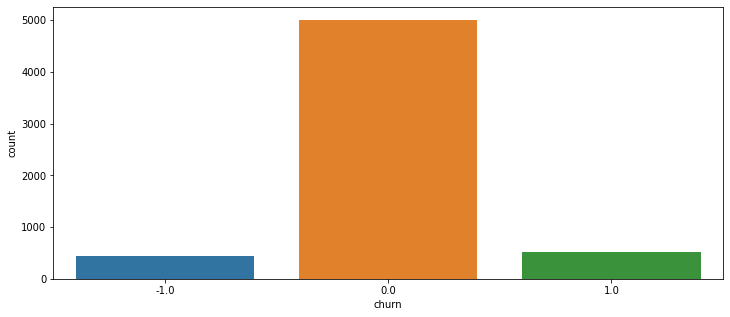

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(12,5))
ax = sns.countplot(data_wide_ess_1418.churn)
plt.show()

In [47]:
subtract_1814 = merkey2018.set_index('h_merkey').subtract(merkey2014.set_index('h_merkey'), fill_value=0)

For 1 = General household, 2 = Household in need, when changed into 2 from 1, the house got poorer, and vice versa.


In [48]:
subtract_1814.head()

h_ws         h_wg  h_id  h_ind  h_sn  h_new  h_cobf  h_ws_all  \
h_merkey                                                                      
10101.0  -0.487315 -1706.010843  -1.0   -1.0  -1.0    0.0     0.0 -0.467776   
20101.0   0.050634   451.309038   0.0    0.0   0.0    0.0     0.0  0.044232   
30101.0   0.117986   793.143722   0.0    0.0   0.0    0.0     0.0  0.097208   
40101.0   0.040869   395.341910   0.0    0.0   0.0    0.0     0.0  0.107796   
60101.0   0.171562   894.078918   0.0    0.0   0.0    0.0     0.0  0.168090   

             h_wg_all  h_reg5  h_reg7  h_flag  nh01_1  nh01_2  h01_1  h_pind1  \
h_merkey                                                                        
10101.0  -1265.510373    -1.0    -1.0     0.0     NaN     NaN   -1.0     -1.0   
20101.0    356.587773     0.0     0.0     0.0     NaN     NaN    0.0      0.0   
30101.0    573.621088     0.0     0.0     0.0     NaN     NaN    0.0      0.0   
40101.0    509.441049     0.0     0.0     0.0     NaN     NaN   -1.0      0.0   
60101.0    710.949711     0.0     0.0     0.0     NaN     NaN    0.0      0.0   

          h_pid1  h01_2  h01_3  h01_4   h01_5  h01_6  h01_7  h01_8  h01_9  \
h_merkey                                                                    
10101.0   -101.0   -1.0  -10.0   -2.0 -1936.0   -2.0    0.0    0.0    0.0   
20101.0      0.0    0.0    0.0    0.0     0.0    0.0    0.0    0.0    0.0   
30101.0      0.0    0.0    0.0    0.0     0.0    0.0    0.0    0.0    0.0   
40101.0      0.0    0.0    0.0    0.0     0.0    0.0    0.0    0.0    0.0   
60101.0      0.0    0.0    0.0    0.0     0.0    0.0    0.0    0.0    0.0   

          h01_11  h01_12  h01_13  h_pind2  h_pid2  h01_14  h01_15  h01_16  \
h_merkey                                                                    
10101.0     -2.0    -2.0    -1.0      NaN     NaN     NaN     NaN     NaN   
20101.0      0.0    -1.0     0.0      NaN     NaN     NaN     NaN     NaN   
30101.0      0.0     0.0     0.0      NaN     NaN     NaN     NaN     NaN   
40101.0      0.0     0.0     0.0     -4.0  -402.0    -2.0    -2.0    -2.0   
60101.0      0.0     0.0     0.0      0.0     0.0     0.0     0.0     0.0   

          h01_17  h01_18  h01_19  h01_20  h01_21  h01_23  h01_24  h01_25  \
h_merkey                                                                   
10101.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
20101.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
30101.0      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
40101.0  -1923.0    -2.0     0.0     0.0     0.0    -2.0    -1.0    -1.0   
60101.0      0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   

          h_pind3  h_pid3  h01_26  h01_27  h01_28  h01_29  h01_30  h01_31  \
h_merkey                                                                    
10101.0       NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
20101.0       NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
30101.0       NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
40101.0       NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
60101.0       0.0     0.0     0.0     0.0     0.0     0.0     1.0     0.0   

          h01_32  h01_33  h01_35  h01_36  h01_37  h_pind4  h_pid4  h01_38  \
h_merkey                                                                    
10101.0      NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
20101.0      NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
30101.0      NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
40101.0      NaN     NaN     NaN     NaN     NaN      NaN     NaN     NaN   
60101.0      0.0     0.0     0.0     0.0     0.0      0.0     0.0     0.0   

          h01_39  h01_40  h01_41  h01_42  h01_43  h01_44  h01_45  h01_47  \
h_merkey                                                                   
10101.0      NaN     NaN     NaN     NaN     Na

In [49]:
nandropped = subtract_1814.dropna(axis=1)
nandropped.head()

,h_id,h_ind,h_sn,h_new,h_ws_all,h_wg_all,h_reg5,h_reg7,h_flag,h01_1,h_pind1,h_pid1,h01_2,h01_3,h01_4,h01_5,h01_6,h01_7,h01_8,h01_9,h01_11,h01_12,h01_13,h01_110,h02_1,h02_2,h02_3,h02_4,h02_5,h02_6,h02_7,h02_8,h02_aq1,h02_3aq1,h03_1,h03_2,h03_4,h04_1,h04_aq1,h04_8,h04_9,h04_11,h04_10,h04_aq11,h04_7aq1,h05_1,h05_3aq2,h06_1,h06_2,h06_4,h06_5,h06_3,h06_11,h06_12,h06_13,h06_14,h06_21,h06_22,h06_23,h06_24,h06_25,h06_27,h06_30,h06_33,h06_36,h06_39,h06_3aq1,h07_3aq1,h07_3aq2,h07_5aq1,h07_3aq3,h07_3aq4,h07_3aq5,h07_6aq1,h07_3aq6,h07_5aq2,h07_3aq7,h07_3aq8,h07_3aq9,h07_3aq10,h07_3aq11,h07_5aq3,h07_5aq4,h07_3aq13,h07_6aq4,h07_6aq6,h07_3aq14,h07_3aq15,h07_3aq16,h07_3aq17,h07_4,h07_6aq7,h07_6aq8,h07_6aq9,h07_6aq10,h07_6aq11,h07_5,h07_6aq12,h07_6aq13,h07_6aq14,h07_9,h08_1,h08_2,h08_4,h08_6,h08_8,h08_10,h08_12,h08_106,h08_107,h08_108,h08_109,h08_110,h08_111,h08_113,h08_121,h08_147,h08_aq1,h08_171,h08_172,h08_aq9,h08_aq10,h08_aq11,h08_aq13,h08_aq14,h08_aq15,h08_6aq1,h08_aq16,h08_10aq1,h08_aq19,h08_aq20,h08_aq21,h08_5aq3,h08_aq22,h08_aq23,h08_aq24,h08_4aq116,h08_4aq117,h08_5aq1,h08_7aq4,h08_7aq6,h08_7aq8,h08_aq25,h08_aq26,h08_aq27,h08_aq28,h08_aq29,h08_3aq5,h08_4aq118,h08_aq30,h08_6aq3,h08_3aq6,h08_3aq7,h08_aq34,h09_aq1,h09_aq2,h09_aq3,h09_aq4,h09_aq5,h09_aq6,h09_aq7,h09_aq8,h10_aq1,h10_aq2,h10_aq3,h10_aq4,h10_aq5,h10_aq6,h10_aq7,h10_aq8,h10_aq9,h10_aq10,h10_aq11,h10_aq12,h10_aq13,h10_aq14,h10_aq15,h10_aq16,h10_aq17,h10_aq18,h10_aq19,h10_aq20,h10_26,h10_27,h10_aq23,h10_aq24,h10_aq25,h10_aq26,h11_2,h11_3,h11_4,h11_5,h11_6,h11_7,h11_8,h11_3aq1,h11_3aq2,h11_3aq3,h11_3aq4,h11_3aq6,h11_3aq7,h12_1_4aq1,h12_1_5aq1,h12_1_4aq2,h13_2,h13_6,h13_10,h13_14,h13_18,h13_22,h13_26,h13_8aq1,h13_5aq1,h13_8aq2,h13_4aq1,h13_4aq16,h17_1,h17_3,h17_4,h17_5,h17_6,h17_7,release_date
h_merkey,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10101.0,-1.0,-1.0,-1.0,0.0,-0.467776,-1265.510373,-1.0,-1.0,0.0,-1.0,-1.0,-101.0,-1.0,-10.0,-2.0,-1936.0,-2.0,0.0,0.0,0.0,-2.0,-2.0,-1.0,-1.0,-1.0,-3.0,-60.0,0.0,0.0,0.0,-3.0,0.0,-3.0,0.0,-1.0,-2.0,-9.0,-1.0,0.0,0.0,0.0,0.0,0.0,-4.0,-4.0,-1.0,0.0,-2.0,-3.0,-2.0,-33.0,-2.0,-1.0,-1.0,-2.0,-1.0,-1.0,-1.0,-1.0,-1.0,-5.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-23.0,-3.0,0.0,0.0,0.0,-8.0,-5.0,-3.0,0.0,-4.0,-16.0,0.0,0.0,-1.0,-1.0,-2.0,-13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-74.0,-1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-120.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,0.0,0.0,-682.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,-3.0,-2.0,-2.0,-2.0,-2.0,-3.0,-3.0,-2.0,-2.0,-2.0,-1.0,-2.0,-1.0,-1.0,-1.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-7.0,-4.0,-2.0,-3.0,-1.0,-1.0,-200407.0
20101.0,0.0,0.0,0.0,0.0,0.044232,356.587773,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,1.0,3.0,1.0,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,-106.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,4.0,0.0,0.0,0.1,5.0,4.0,24.5,0.0,48.0,31.0,0.0,0.0,7.0,11.0,4.0,22.0,-1.7,2.5,0.0,0.0,3.0,0.0,8.0,0.0,8.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,172.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,57.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1660.0,13.0,13000.0,0.0,0.0,1500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2860.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,-1.0,0.0
30

In [78]:
merged = pd.merge(nandropped, churn_data, how='inner', on='h_merkey')
merged.head()

,h_merkey,h_id,h_ind,h_sn,h_new,h_ws_all,h_wg_all,h_reg5,h_reg7,h_flag,h01_1,h_pind1,h_pid1,h01_2,h01_3,h01_4,h01_5,h01_6,h01_7,h01_8,h01_9,h01_11,h01_12,h01_13,h01_110,h02_1,h02_2,h02_3,h02_4,h02_5,h02_6,h02_7,h02_8,h02_aq1,h02_3aq1,h03_1,h03_2,h03_4,h04_1,h04_aq1,h04_8,h04_9,h04_11,h04_10,h04_aq11,h04_7aq1,h05_1,h05_3aq2,h06_1,h06_2,h06_4,h06_5,h06_3,h06_11,h06_12,h06_13,h06_14,h06_21,h06_22,h06_23,h06_24,h06_25,h06_27,h06_30,h06_33,h06_36,h06_39,h06_3aq1,h07_3aq1,h07_3aq2,h07_5aq1,h07_3aq3,h07_3aq4,h07_3aq5,h07_6aq1,h07_3aq6,h07_5aq2,h07_3aq7,h07_3aq8,h07_3aq9,h07_3aq10,h07_3aq11,h07_5aq3,h07_5aq4,h07_3aq13,h07_6aq4,h07_6aq6,h07_3aq14,h07_3aq15,h07_3aq16,h07_3aq17,h07_4,h07_6aq7,h07_6aq8,h07_6aq9,h07_6aq10,h07_6aq11,h07_5,h07_6aq12,h07_6aq13,h07_6aq14,h07_9,h08_1,h08_2,h08_4,h08_6,h08_8,h08_10,h08_12,h08_106,h08_107,h08_108,h08_109,h08_110,h08_111,h08_113,h08_121,h08_147,h08_aq1,h08_171,h08_172,h08_aq9,h08_aq10,h08_aq11,h08_aq13,h08_aq14,h08_aq15,h08_6aq1,h08_aq16,h08_10aq1,h08_aq19,h08_aq20,h08_aq21,h08_5aq3,h08_aq22,h08_aq23,h08_aq24,h08_4aq116,h08_4aq117,h08_5aq1,h08_7aq4,h08_7aq6,h08_7aq8,h08_aq25,h08_aq26,h08_aq27,h08_aq28,h08_aq29,h08_3aq5,h08_4aq118,h08_aq30,h08_6aq3,h08_3aq6,h08_3aq7,h08_aq34,h09_aq1,h09_aq2,h09_aq3,h09_aq4,h09_aq5,h09_aq6,h09_aq7,h09_aq8,h10_aq1,h10_aq2,h10_aq3,h10_aq4,h10_aq5,h10_aq6,h10_aq7,h10_aq8,h10_aq9,h10_aq10,h10_aq11,h10_aq12,h10_aq13,h10_aq14,h10_aq15,h10_aq16,h10_aq17,h10_aq18,h10_aq19,h10_aq20,h10_26,h10_27,h10_aq23,h10_aq24,h10_aq25,h10_aq26,h11_2,h11_3,h11_4,h11_5,h11_6,h11_7,h11_8,h11_3aq1,h11_3aq2,h11_3aq3,h11_3aq4,h11_3aq6,h11_3aq7,h12_1_4aq1,h12_1_5aq1,h12_1_4aq2,h13_2,h13_6,h13_10,h13_14,h13_18,h13_22,h13_26,h13_8aq1,h13_5aq1,h13_8aq2,h13_4aq1,h13_4aq16,h17_1,h17_3,h17_4,h17_5,h17_6,h17_7,release_date,churn
0,10101.0,-1.0,-1.0,-1.0,0.0,-0.467776,-1265.510373,-1.0,-1.0,0.0,-1.0,-1.0,-101.0,-1.0,-10.0,-2.0,-1936.0,-2.0,0.0,0.0,0.0,-2.0,-2.0,-1.0,-1.0,-1.0,-3.0,-60.0,0.0,0.0,0.0,-3.0,0.0,-3.0,0.0,-1.0,-2.0,-9.0,-1.0,0.0,0.0,0.0,0.0,0.0,-4.0,-4.0,-1.0,0.0,-2.0,-3.0,-2.0,-33.0,-2.0,-1.0,-1.0,-2.0,-1.0,-1.0,-1.0,-1.0,-1.0,-5.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-23.0,-3.0,0.0,0.0,0.0,-8.0,-5.0,-3.0,0.0,-4.0,-16.0,0.0,0.0,-1.0,-1.0,-2.0,-13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-74.0,-1.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-120.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.0,0.0,0.0,-682.0,-3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,-3.0,-2.0,-2.0,-2.0,-2.0,-3.0,-3.0,-2.0,-2.0,-2.0,-1.0,-2.0,-1.0,-1.0,-1.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,-7.0,-4.0,-2.0,-3.0,-1.0,-1.0,-200407.0,NaN
1,20101.0,0.0,0.0,0.0,0.0,0.044232,356.587773,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,1.0,3.0,1.0,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,-106.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,4.0,0.0,0.0,0.1,5.0,4.0,24.5,0.0,48.0,31.0,0.0,0.0,7.0,11.0,4.0,22.0,-1.7,2.5,0.0,0.0,3.0,0.0,8.0,0.0,8.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,172.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,57.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1660.0,13.0,13000.0,0.0,0.0,1500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2860.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,-1.0,0.0,-1.0
2,30101.0,0.0,0.0,0.0,0.0,0.097208,573.621088,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0,0.0,0.0,-1.0,-1.0,-2.0,-2.0,0.0,2.0

In [79]:
merged.dropna(subset = ["churn"], inplace=True)

In [80]:
merged['churn'].value_counts()

 0.0    5004
 1.0     522
-1.0     445
Name: churn, dtype: int64

In [81]:
mtrain_labels = np.array(merged['churn'])
mtrain_labels

array([-1.,  1.,  0., ...,  0.,  0.,  0.])

In [82]:
merged = merged.drop(columns = ["h_merkey", "churn", "h07_6aq7"])
merged.head()

,h_id,h_ind,h_sn,h_new,h_ws_all,h_wg_all,h_reg5,h_reg7,h_flag,h01_1,h_pind1,h_pid1,h01_2,h01_3,h01_4,h01_5,h01_6,h01_7,h01_8,h01_9,h01_11,h01_12,h01_13,h01_110,h02_1,h02_2,h02_3,h02_4,h02_5,h02_6,h02_7,h02_8,h02_aq1,h02_3aq1,h03_1,h03_2,h03_4,h04_1,h04_aq1,h04_8,h04_9,h04_11,h04_10,h04_aq11,h04_7aq1,h05_1,h05_3aq2,h06_1,h06_2,h06_4,h06_5,h06_3,h06_11,h06_12,h06_13,h06_14,h06_21,h06_22,h06_23,h06_24,h06_25,h06_27,h06_30,h06_33,h06_36,h06_39,h06_3aq1,h07_3aq1,h07_3aq2,h07_5aq1,h07_3aq3,h07_3aq4,h07_3aq5,h07_6aq1,h07_3aq6,h07_5aq2,h07_3aq7,h07_3aq8,h07_3aq9,h07_3aq10,h07_3aq11,h07_5aq3,h07_5aq4,h07_3aq13,h07_6aq4,h07_6aq6,h07_3aq14,h07_3aq15,h07_3aq16,h07_3aq17,h07_4,h07_6aq8,h07_6aq9,h07_6aq10,h07_6aq11,h07_5,h07_6aq12,h07_6aq13,h07_6aq14,h07_9,h08_1,h08_2,h08_4,h08_6,h08_8,h08_10,h08_12,h08_106,h08_107,h08_108,h08_109,h08_110,h08_111,h08_113,h08_121,h08_147,h08_aq1,h08_171,h08_172,h08_aq9,h08_aq10,h08_aq11,h08_aq13,h08_aq14,h08_aq15,h08_6aq1,h08_aq16,h08_10aq1,h08_aq19,h08_aq20,h08_aq21,h08_5aq3,h08_aq22,h08_aq23,h08_aq24,h08_4aq116,h08_4aq117,h08_5aq1,h08_7aq4,h08_7aq6,h08_7aq8,h08_aq25,h08_aq26,h08_aq27,h08_aq28,h08_aq29,h08_3aq5,h08_4aq118,h08_aq30,h08_6aq3,h08_3aq6,h08_3aq7,h08_aq34,h09_aq1,h09_aq2,h09_aq3,h09_aq4,h09_aq5,h09_aq6,h09_aq7,h09_aq8,h10_aq1,h10_aq2,h10_aq3,h10_aq4,h10_aq5,h10_aq6,h10_aq7,h10_aq8,h10_aq9,h10_aq10,h10_aq11,h10_aq12,h10_aq13,h10_aq14,h10_aq15,h10_aq16,h10_aq17,h10_aq18,h10_aq19,h10_aq20,h10_26,h10_27,h10_aq23,h10_aq24,h10_aq25,h10_aq26,h11_2,h11_3,h11_4,h11_5,h11_6,h11_7,h11_8,h11_3aq1,h11_3aq2,h11_3aq3,h11_3aq4,h11_3aq6,h11_3aq7,h12_1_4aq1,h12_1_5aq1,h12_1_4aq2,h13_2,h13_6,h13_10,h13_14,h13_18,h13_22,h13_26,h13_8aq1,h13_5aq1,h13_8aq2,h13_4aq1,h13_4aq16,h17_1,h17_3,h17_4,h17_5,h17_6,h17_7,release_date
1,0.0,0.0,0.0,0.0,0.044232,356.587773,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,1.0,3.0,1.0,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,-106.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,4.0,0.0,0.0,0.1,5.0,4.0,24.5,0.0,48.0,31.0,0.0,0.0,7.0,11.0,4.0,22.0,-1.7,2.5,0.0,0.0,3.0,0.0,8.0,8.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,172.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,57.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,1660.0,13.0,13000.0,0.0,0.0,1500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2860.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,-1.0,0.0
2,0.0,0.0,0.0,0.0,0.097208,573.621088,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0,0.0,0.0,-1.0,-1.0,-2.0,-2.0,0.0,2.0,0.0,0.0,0.0,2.0,1.0,10.0,0.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,-9.0,0.0,10.0,0.0,2.0,0.8,2.0,0.0,-1.6,4.0,0.0,0.0,0.0,-2.0,-1.0,-2.0,-1.7,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,-3.0,0.0,-2.5,-0.7,2.0,0.0,0.0,-1.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,147.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,530.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,500.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,2.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.107796,509.441049,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,-1.0,-2.0,0.0,0.0,0.0,-2.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-15.0,7.0,0.0,0.0,0.3,-3.0,-2.6,-1.0,0.0,-3.0,-1.0,0.0,0.0,-1.0,4.0,-4.0,39.0,-2

In [83]:
mx_train, mx_test, my_train, my_test = train_test_split(merged, mtrain_labels, test_size = 0.20, random_state = 20)

In [84]:
mcmodel = XGBClassifier(booster='gbtree', objective='multi:softmax')
mcmodel.fit(mx_train, my_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [85]:
calculate_accuracy(mcmodel, mx_test, my_test)

Accuracy: 85.61%


0.8560669456066946

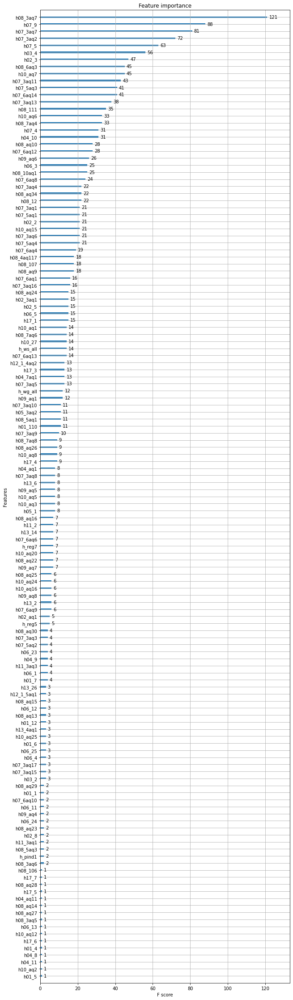

In [86]:
rcParams['figure.figsize'] = 10,40
xgboost.plot_importance(mcmodel)

In [87]:
explainer = shap.TreeExplainer(mcmodel)
shap_values = explainer.shap_values(mx_train)
minus1=shap_values[0]
zero=shap_values[1]
plus1=shap_values[2]

In [88]:
shap_values

[array([[ 0.        ,  0.        ,  0.        , ..., -0.0001586 ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ..., -0.00031074,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ..., -0.00024689,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ..., -0.0001586 ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ..., -0.00073779,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ..., -0.00073779,
          0.        ,  0.        ]], dtype=float32),
 array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         -0.00182242,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         -0.00182242,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         -0.00182242,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0. 

In [89]:
idx = 16
print(mx_train.iloc[idx, :])

h_id              0.000000
h_ind             0.000000
h_sn              0.000000
h_new             0.000000
h_ws_all         -0.017215
h_wg_all        140.553276
h_reg5            0.000000
h_reg7            0.000000
h_flag            0.000000
h01_1            -1.000000
h_pind1           0.000000
h_pid1            0.000000
h01_2             0.000000
h01_3             0.000000
h01_4             0.000000
h01_5             0.000000
h01_6             0.000000
h01_7             0.000000
h01_8             0.000000
h01_9             0.000000
h01_11            0.000000
h01_12            0.000000
h01_13            0.000000
h01_110          -4.000000
h02_1             0.000000
h02_2             0.000000
h02_3           231.000000
h02_4             2.000000
h02_5            55.000000
h02_6             1.000000
h02_7             0.000000
h02_8             0.000000
h02_aq1           0.000000
h02_3aq1          0.000000
h03_1             0.000000
h03_2             1.000000
h03_4             0.000000
h

In [90]:
shap.initjs()

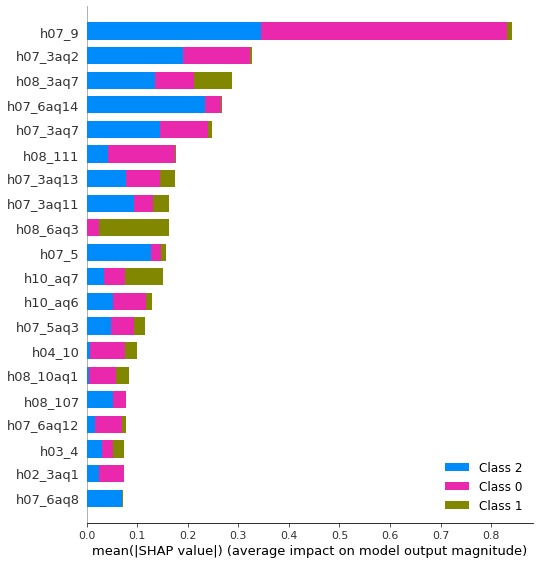

In [91]:
shap.summary_plot(shap_values, mx_train, plot_type="bar")

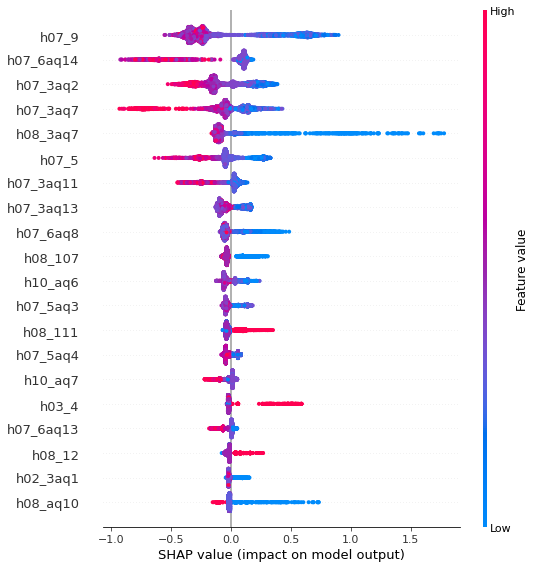

In [92]:
shap.summary_plot(shap_values[2], mx_train)